# Unsupervised Atomic-Scale Defect Dynamics Analysis (HAADF-STEM)

## Overview
This notebook implements a **self-supervised learning workflow** to analyze atomic-scale defect dynamics in time-resolved HAADF-STEM image stacks. The goal is to identify, track, and spatially localize dynamically evolving atomic environments **without using labeled defect data**. This unsupervised approach complements a parallel supervised learning pipeline developed by collaborators.

---

## Data and Preprocessing
Aligned HAADF-STEM image stacks (DM3 format) are loaded using HyperSpy. Each frame is lightly smoothed spatially (no temporal smoothing) and normalized independently to suppress global contrast variations while preserving local atomic features.

---

## Atomic Site Detection and Patch Extraction
Atomic columns are detected in a reference frame using peak finding. Small atom-centered image patches are extracted around each detected site across all time frames. Patches are normalized individually to reduce sensitivity to absolute intensity scaling.

---

## Self-Supervised Feature Learning
A compact convolutional autoencoder (CAE) is trained in a self-supervised manner to reconstruct atom-centered patches. The encoder learns a low-dimensional latent representation that captures local atomic environments without predefined labels.

---

## Atomic Feature Clustering and Tracking
Latent feature vectors are standardized and clustered to identify distinct atomic feature types. Each atomic site is assigned a feature label at every time step, enabling construction of atom-wise feature trajectories over time.

---

## Atomic Instability and Defect Dynamics
An atomic instability metric is defined as the number of feature label changes over time for each atom. Changing atoms are further classified into **persistent**, **oscillatory**, and **transient** dynamics based on their temporal feature sequences, distinguishing different types of defect-related behavior.

---

## Spatial Density Analysis of Defects
Spatial density maps of unstable atoms are constructed and smoothed to identify **dense defect regions**. Thresholding the density fields highlights spatially coherent defect-rich zones. Overlap analysis across different dynamics classes reveals regions of complex structural heterogeneity.

---

## Outputs
- Atomic feature maps per frame  
- Atom-wise instability maps (continuous and discrete levels)  
- Ranked unstable atoms with image panels and animations  
- Density-based maps of defect-rich regions  
- Overlap maps of defect dynamics classes  

All figures and animations are saved automatically into dataset-specific result directories.

---

## Purpose
This unsupervised workflow enables **discovery-driven analysis** of atomic-scale defect dynamics, revealing subtle and unexpected behaviors that are difficult to annotate manually. It is designed to complement supervised defect identification methods and to support exploratory studies of complex materials systems.


### Load HAADF-STEM time series
Load aligned DM3 stack and inspect dimensions.


In [458]:
import hyperspy.api as hs
import numpy as np

StackIn = hs.load('3D Stack align2.dm3')

print("Type:", type(StackIn))
print("Signal type:", getattr(StackIn, "signal_type", None))
print("Data shape:", StackIn.data.shape)



Type: <class 'hyperspy._signals.signal2d.Signal2D'>
Signal type: None
Data shape: (10, 1024, 1024)


Creating the file directory

In [459]:
import os

# --- robust filename extraction from HyperSpy Signal ---
fname = None

# 1) Best: original_metadata.General.original_filename (common for DM3)
try:
    fname = StackIn.original_metadata.General.original_filename
except Exception:
    pass

# 2) Next: StackIn.metadata.General.title (attribute, not .get)
if not fname:
    try:
        fname = StackIn.metadata.General.title
    except Exception:
        pass

# 3) Next: StackIn.metadata.General.original_filename (sometimes present)
if not fname:
    try:
        fname = StackIn.metadata.General.original_filename
    except Exception:
        pass

# 4) Fallback: generic name
if not fname:
    fname = "unknown"

# sanitize
imported_filename = os.path.splitext(os.path.basename(str(fname)))[0].replace(" ", "_")
print("Detected file name:", imported_filename)


Detected file name: 3D_Stack_align2


### Image preprocessing
Apply light spatial smoothing and normalize each frame independently to [0,1].

### Inspect selected frames
Visualize representative frames to verify contrast and alignment.


nIm shape: (10, 1024, 1024)
Per-frame min: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Per-frame max: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


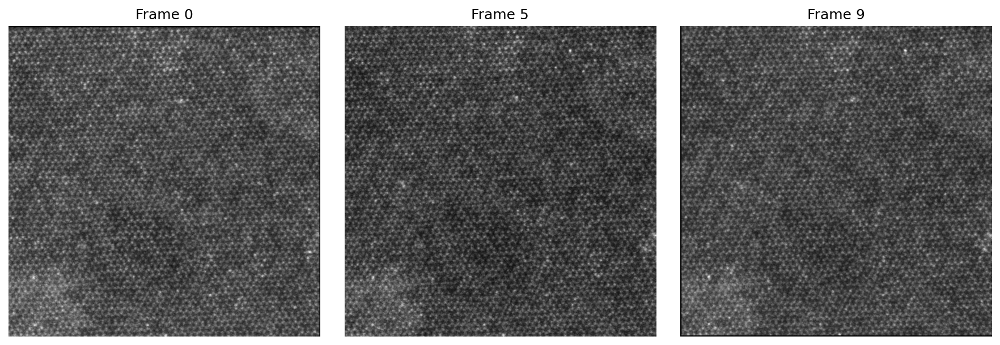

In [460]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

data = StackIn.data.astype(np.float32)   # (10, 1024, 1024)

# Optional smoothing (no smoothing across time)
sigma = 1.0
data_s = ndimage.gaussian_filter(data, sigma=(0, sigma, sigma))

# Normalize each frame independently to [0, 1]
eps = 1e-12
mins = data_s.min(axis=(1,2), keepdims=True)
ptps = np.ptp(data_s, axis=(1,2), keepdims=True)
nIm = (data_s - mins) / (ptps + eps)

print("nIm shape:", nIm.shape)
print("Per-frame min:", nIm.min(axis=(1,2)))
print("Per-frame max:", nIm.max(axis=(1,2)))

# Show three frames
frames_to_show = [0, 5, 9]
fig, axs = plt.subplots(1, len(frames_to_show), figsize=(12,4), dpi=150)
for ax, t in zip(axs, frames_to_show):
    ax.imshow(nIm[t], cmap="gray")
    ax.set_title(f"Frame {t}")
    ax.axis("off")
plt.tight_layout()
plt.show()


The folowing step extracts and normalizes overlapping local image patches from the STEM time series and prepares them for self-supervised learning, allowing the network to learn common local atomic-scale features without labels.
### Atomic site detection
Detect atom positions in a reference frame using peak finding.

### Atom-centered patch extraction
Extract local patches around detected atomic sites for all time frames.

### Patch normalization and batching
Normalize patches per atom and prepare DataLoader for self-supervised learning.



Detected atom candidates: 8216


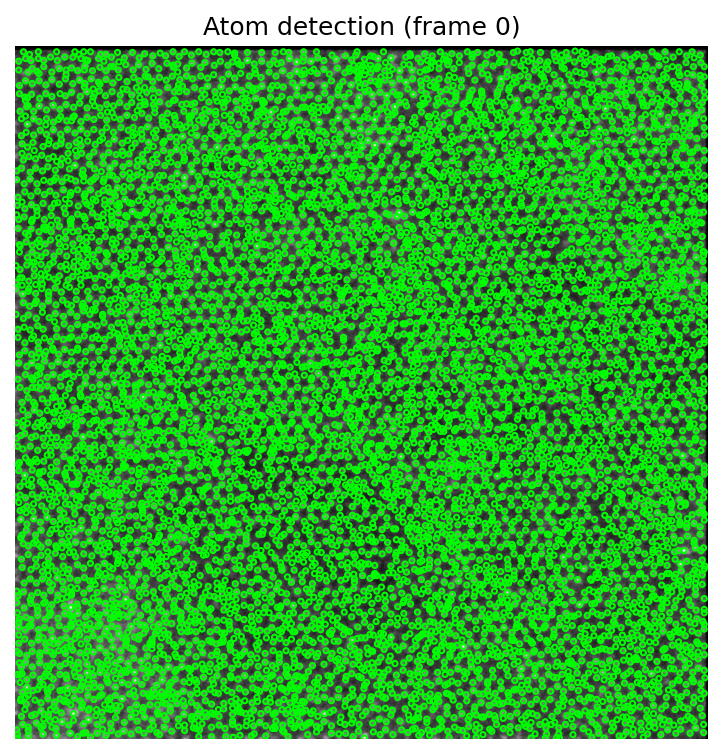

Atom patches: (80510, 16, 16) meta: (80510, 3)
X tensor: torch.Size([80510, 1, 16, 16])
DataLoader ready. batches per epoch: 628


In [461]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset
from scipy import ndimage
from skimage.feature import peak_local_max as MaxPeak
import matplotlib.pyplot as plt

# ----------------------------
# Parameters (tune these first)
# ----------------------------
t_ref = 0                 # reference frame for atom detection
atom_patch = 16           # RECOMMENDED: 16 or 32 (divisible by 4 avoids shape issues)
half = atom_patch // 2

min_dist = 1              # pixels; tune 4–10 based on lattice spacing
peak_thr_rel = 0.1       # tune 0.15–0.40
max_peaks = 12000         # safety cap

max_atoms = 10000          # cap for speed; adjust 3000–10000
batch_size = 128          # adjust for your machine (CPU: 64–128; GPU: 256)

# ----------------------------
# Detect atoms in reference frame
# ----------------------------
T, H, W = nIm.shape
img0 = nIm[t_ref].astype(np.float32)

# light smoothing helps peak detection
imgf = ndimage.gaussian_filter(img0, sigma=1.0)

coords = MaxPeak(
    imgf,
    min_distance=min_dist,
    threshold_rel=peak_thr_rel,
    num_peaks=max_peaks
)  # (N,2) rows, cols

print("Detected atom candidates:", coords.shape[0])

# Optional: randomly subsample atoms for speed
if coords.shape[0] > max_atoms:
    rng = np.random.default_rng(0)
    idx = rng.choice(coords.shape[0], size=max_atoms, replace=False)
    coords = coords[idx]
    print("Subsampled atoms to:", coords.shape[0])

# visualize detection
plt.figure(figsize=(6,6), dpi=150)
plt.imshow(img0, cmap="gray")
plt.scatter(coords[:,1], coords[:,0], s=6, facecolors="none", edgecolors="lime")
plt.title(f"Atom detection (frame {t_ref})")
plt.axis("off")
plt.show()

# ----------------------------
# Extract atom-centered patches across all frames
# ----------------------------
patches = []
meta = []  # (t, r_center, c_center)

for t in range(T):
    img = nIm[t].astype(np.float32)
    for (r, c) in coords:
        r = int(r); c = int(c)
        if r-half < 0 or r+half >= H or c-half < 0 or c+half >= W:
            continue
        p = img[r-half:r+half, c-half:c+half]   # shape (atom_patch, atom_patch)
        patches.append(p)
        meta.append((t, r, c))

patches = np.stack(patches, axis=0).astype(np.float32)  # (N_total, atom_patch, atom_patch)
meta = np.array(meta, dtype=int)

print("Atom patches:", patches.shape, "meta:", meta.shape)

# ----------------------------
# Per-patch normalization
# ----------------------------
eps = 1e-6
p_mean = patches.mean(axis=(1,2), keepdims=True)
p_std  = patches.std(axis=(1,2), keepdims=True)
patches_n = (patches - p_mean) / (p_std + eps)

# ----------------------------
# Torch tensors + DataLoader
# ----------------------------
X = torch.tensor(patches_n[:, None, :, :], dtype=torch.float32)  # (N,1,atom_patch,atom_patch)

print("X tensor:", X.shape)

ds = TensorDataset(X, X)  # autoencoder target = input
loader = DataLoader(ds, batch_size=batch_size, shuffle=True, drop_last=True)

print("DataLoader ready. batches per epoch:", len(loader))


### Atomic convolutional autoencoder
Define a small CNN autoencoder to learn local atomic environments.


In [462]:
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

class AtomicCAE(nn.Module):
    """
    Small convolutional autoencoder for atom-centered patches.
    Returns:
      y : reconstructed patch
      z : latent feature map (used for clustering)
    """
    def __init__(self):
        super().__init__()
        # Encoder
        self.enc = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),               # /2
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),               # /4
        )
        # Decoder
        self.dec = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv2d(32, 16, 3, padding=1), nn.ReLU(),
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv2d(16, 1, 3, padding=1),
        )

    def forward(self, x):
        z = self.enc(x)
        y = self.dec(z)
        # safety crop in case of odd sizes
        y = y[:, :, :x.shape[2], :x.shape[3]]
        return y, z

model = AtomicCAE().to(device)
opt = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

print("Model parameters:", sum(p.numel() for p in model.parameters())/1e6, "M")


Device: cpu
Model parameters: 0.009569 M


### Train autoencoder
Train the model using reconstruction loss on atom-centered patches.


In [463]:
import numpy as np

model.train()
epochs = 15   # start with 10–15; increase only if needed

for ep in range(1, epochs + 1):
    losses = []
    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        opt.zero_grad()
        yhat, _ = model(xb)
        loss = loss_fn(yhat, yb)
        loss.backward()
        opt.step()

        losses.append(loss.item())

    print(f"Epoch {ep}/{epochs}  loss={float(np.mean(losses)):.6f}")


Epoch 1/15  loss=0.100153
Epoch 2/15  loss=0.045094
Epoch 3/15  loss=0.036720
Epoch 4/15  loss=0.032807
Epoch 5/15  loss=0.030416
Epoch 6/15  loss=0.028609
Epoch 7/15  loss=0.027279
Epoch 8/15  loss=0.026157
Epoch 9/15  loss=0.025287
Epoch 10/15  loss=0.024411
Epoch 11/15  loss=0.023820
Epoch 12/15  loss=0.023170
Epoch 13/15  loss=0.022714
Epoch 14/15  loss=0.022259
Epoch 15/15  loss=0.021825


Extract latent vectors for all atom patches (batched, fast)

In [464]:
import numpy as np
import torch

model.eval()
latents = []

with torch.no_grad():
    for i in range(0, X.shape[0], 512):  # batch inference
        xb = X[i:i+512].to(device)
        _, z = model(xb)                 # z: (B, C, h, w)
        # compress spatial dims -> vector per atom
        z_vec = z.mean(dim=(2,3))        # Global Average Pooling
        latents.append(z_vec.cpu().numpy())

Z = np.vstack(latents)                   # (N_atoms_total, latent_dim)
print("Latent matrix Z:", Z.shape)


Latent matrix Z: (80510, 32)


### Atomic feature clustering
Standardize latent vectors, reduce noise with PCA, and cluster atomic features.


In [465]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Standardize latent features
Zs = StandardScaler().fit_transform(Z)

# Optional but recommended: reduce noise and speed up clustering
Zp = PCA(n_components=10, random_state=0).fit_transform(Zs)

# Choose number of atomic feature types
K_feat = 3   # try 3–6
kmeans = KMeans(n_clusters=K_feat, random_state=0, n_init="auto")
labels = kmeans.fit_predict(Zp)

print("Atomic feature cluster counts:", np.bincount(labels))


Atomic feature cluster counts: [32361 31732 16417]


### Atomic feature map
Overlay learned atomic feature labels on the STEM image.


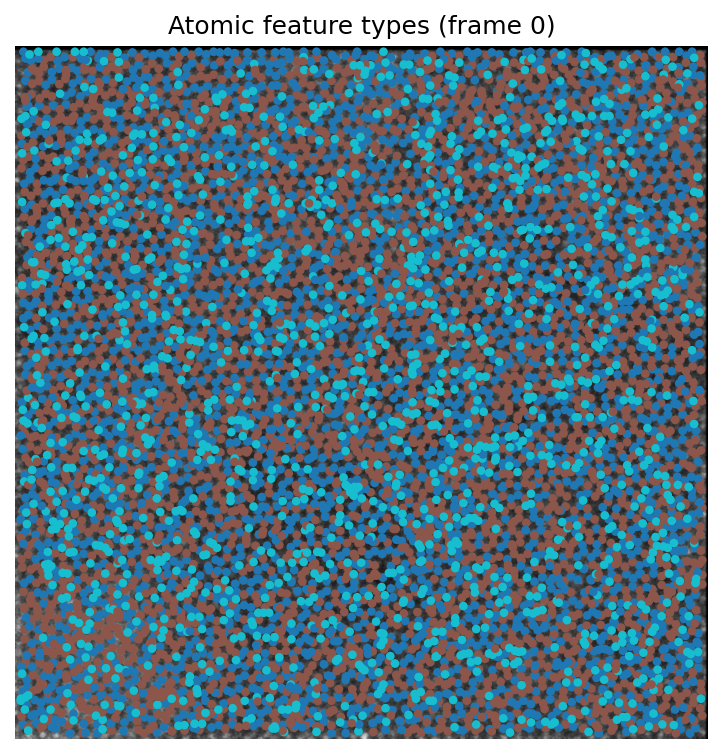

In [466]:
import matplotlib.pyplot as plt

def plot_atomic_features(frame=0, s=10):
    sel = (meta[:,0] == frame)
    xy = meta[sel][:, [2,1]]   # (x=col, y=row)
    lab = labels[sel]

    plt.figure(figsize=(6,6), dpi=150)
    plt.imshow(nIm[frame], cmap="gray")
    plt.scatter(xy[:,0], xy[:,1], c=lab, cmap="tab10", s=s)
    plt.title(f"Atomic feature types (frame {frame})")
    plt.axis("off")
    plt.show()

plot_atomic_features(frame=0)


### Atom-wise feature tracking
Construct a time × atom table of feature labels for temporal analysis.


In [467]:
import numpy as np

# meta: (t, r, c)
# labels: feature label per atom-patch

# build unique atom keys from (r,c)
atom_keys = [(int(r), int(c)) for (_, r, c) in meta]
unique_atoms = sorted(set(atom_keys))
atom_id = {k:i for i,k in enumerate(unique_atoms)}

T = nIm.shape[0]
K = labels.max() + 1

# L[t, atom] = feature label at time t (or -1 if missing)
L = -np.ones((T, len(unique_atoms)), dtype=int)

for i, (t, r, c) in enumerate(meta):
    aid = atom_id[(int(r), int(c))]
    L[int(t), aid] = labels[i]

print("Feature table shape:", L.shape)


Feature table shape: (10, 8051)


### Atomic instability metric
Count how often each atom changes feature label across frames.


In [468]:
# count feature changes per atom
changes = []
for a in range(L.shape[1]):
    seq = L[:,a]
    seq = seq[seq >= 0]
    if len(seq) < 2:
        continue
    changes.append(np.sum(seq[1:] != seq[:-1]))

changes = np.array(changes)

print("Atoms analyzed:", len(changes))
print("Mean feature changes per atom:", changes.mean())
print("Fraction of atoms that changed at least once:", np.mean(changes > 0))


Atoms analyzed: 8051
Mean feature changes per atom: 2.8658551732704014
Fraction of atoms that changed at least once: 0.7888461060737797


### Stability classification
Separate atoms into stable and changing based on feature transitions.


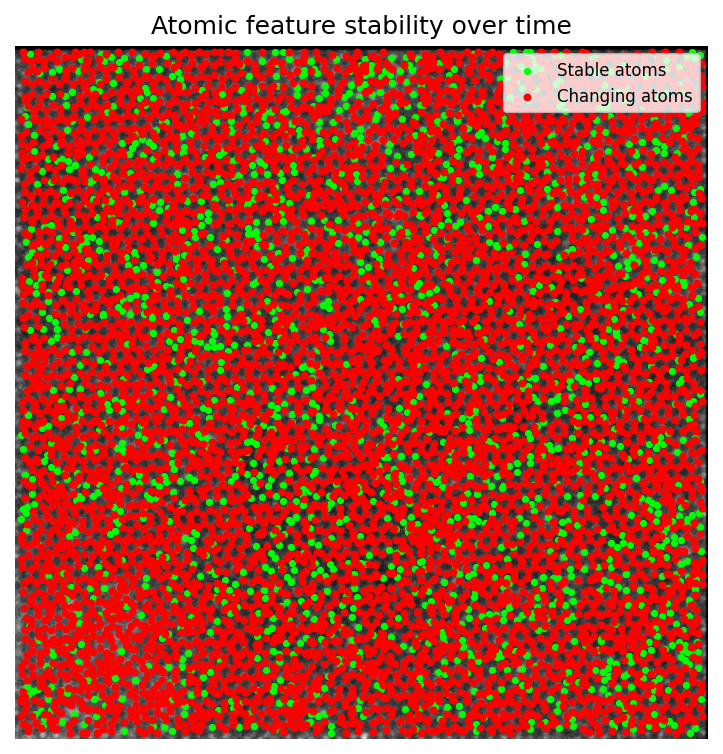

In [469]:
# atoms that ever changed feature
changing_atoms = np.zeros(len(unique_atoms), dtype=bool)

for a in range(L.shape[1]):
    seq = L[:,a]
    seq = seq[seq >= 0]
    if len(seq) >= 2 and np.any(seq[1:] != seq[:-1]):
        changing_atoms[a] = True

# plot
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6), dpi=150)
plt.imshow(nIm[0], cmap="gray")

xy = np.array(unique_atoms)
plt.scatter(
    xy[~changing_atoms,1], xy[~changing_atoms,0],
    s=6, c="lime", label="Stable atoms"
)
plt.scatter(
    xy[changing_atoms,1], xy[changing_atoms,0],
    s=8, c="red", label="Changing atoms"
)

plt.legend(loc="upper right", fontsize=8)
plt.title("Atomic feature stability over time")
plt.axis("off")
plt.show()


In [470]:
import numpy as np

# Count number of feature changes per atom
change_counts = np.zeros(L.shape[1], dtype=int)

for a in range(L.shape[1]):
    seq = L[:, a]
    seq = seq[seq >= 0]   # remove missing
    if len(seq) < 2:
        continue
    change_counts[a] = np.sum(seq[1:] != seq[:-1])

# Atom with maximum changes
a_max = np.argmax(change_counts)

print("Max number of changes:", change_counts[a_max])
print("Atom index:", a_max)

# Atom coordinates
r0, c0 = unique_atoms[a_max]
print("Atom location (row, col):", r0, c0)


Max number of changes: 9
Atom index: 230
Atom location (row, col): 34 868


### Most unstable atomic site
Find the atom with the highest number of feature changes.


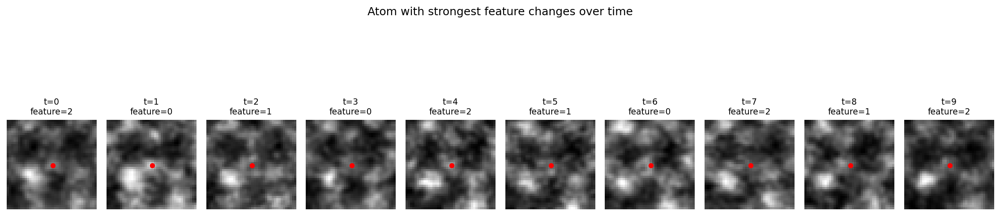

In [471]:
import matplotlib.pyplot as plt

zoom = 20  # pixels around atom; adjust if needed

plt.figure(figsize=(15, 4), dpi=150)

for t in range(T):
    plt.subplot(1, T, t+1)

    img = nIm[t]
    r, c = r0, c0

    # crop with bounds checking
    r1 = max(0, r - zoom)
    r2 = min(img.shape[0], r + zoom)
    c1 = max(0, c - zoom)
    c2 = min(img.shape[1], c + zoom)

    plt.imshow(img[r1:r2, c1:c2], cmap="gray")
    plt.scatter(c - c1, r - r1, c="red", s=20)

    lab = L[t, a_max]
    if lab >= 0:
        plt.title(f"t={t}\nfeature={lab}", fontsize=9)
    else:
        plt.title(f"t={t}\nmissing", fontsize=9)

    plt.axis("off")

plt.suptitle("Atom with strongest feature changes over time", y=1.05)
plt.tight_layout()
plt.show()


### Smooth temporal animation
Create interpolated animation to visualize continuous atomic evolution.


In [472]:
import matplotlib.pyplot as plt
from matplotlib import animation

base_dir = "results"
out_dir = os.path.join(base_dir, imported_filename)
os.makedirs(out_dir, exist_ok=True)


def save_unstable_panel(atom_id, rank, zoom=20):
    r0, c0 = unique_atoms[atom_id]

    fig, axes = plt.subplots(1, T, figsize=(2*T, 2), dpi=150)

    for t in range(T):
        img = nIm[t]
        r1 = max(0, r0-zoom); r2 = min(img.shape[0], r0+zoom)
        c1 = max(0, c0-zoom); c2 = min(img.shape[1], c0+zoom)

        axes[t].imshow(img[r1:r2, c1:c2], cmap="gray")
        axes[t].scatter(c0-c1, r0-r1, c="red", s=20)
        axes[t].set_title(f"t={t}\nF={L[t, atom_id]}", fontsize=8)
        axes[t].axis("off")

    fname = f"unstable_rank{rank:02d}_panel.png"
    fpath = os.path.join(out_dir, fname)

    plt.suptitle(
        f"UNSTABLE atom | rank {rank} | changes={change_counts[atom_id]}",
        y=1.05
    )
    plt.tight_layout()
    plt.savefig(fpath, bbox_inches="tight")
    plt.close(fig)
    print("Saved:", fpath)

def save_unstable_animation(atom_id, rank, zoom=20, n_interp=5, interval=120, fps=8):
    r0, c0 = unique_atoms[atom_id]

    crops = []
    labels_seq = []

    for t in range(T):
        img = nIm[t]
        r1 = max(0, r0-zoom); r2 = min(img.shape[0], r0+zoom)
        c1 = max(0, c0-zoom); c2 = min(img.shape[1], c0+zoom)
        crops.append(img[r1:r2, c1:c2])
        labels_seq.append(L[t, atom_id])

    frames, titles = [], []
    for t in range(T-1):
        A, B = crops[t], crops[t+1]
        for k in range(n_interp):
            alpha = k / n_interp
            frames.append((1-alpha)*A + alpha*B)
            titles.append(f"t={t}→{t+1} | F={labels_seq[t]}")
    frames.append(crops[-1])
    titles.append(f"t={T-1} | F={labels_seq[-1]}")

    fig, ax = plt.subplots(figsize=(4,4), dpi=150)
    im = ax.imshow(frames[0], cmap="gray")
    pt = ax.scatter([zoom], [zoom], c="red", s=25)
    title = ax.set_title("")
    ax.axis("off")

    def update(i):
        im.set_data(frames[i])
        title.set_text(titles[i])
        return im, pt, title

    anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=interval)

    fname = f"unstable_rank{rank:02d}.gif"
    fpath = os.path.join(out_dir, fname)
    anim.save(fpath, writer="pillow", fps=fps)
    plt.close(fig)
    print("Saved:", fpath)

# ---- generate outputs for unstable atoms only ----
topN = 5
order_changing = np.argsort(-change_counts)
top_changing = order_changing[:topN]

for i, a in enumerate(top_changing, start=1):
    # save_unstable_panel(a, i, zoom=20)
    save_unstable_animation(a, i, zoom=20, n_interp=5)


Saved: results\3D_Stack_align2\unstable_rank01.gif
Saved: results\3D_Stack_align2\unstable_rank02.gif
Saved: results\3D_Stack_align2\unstable_rank03.gif
Saved: results\3D_Stack_align2\unstable_rank04.gif
Saved: results\3D_Stack_align2\unstable_rank05.gif


### Overview of unstable atomic sites
Overlay ranked unstable atoms on the reference image.


In [473]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,7), dpi=150)
plt.imshow(nIm[0], cmap="gray")

for rank, a in enumerate(top_changing, start=1):
    r, c = unique_atoms[a]
    plt.scatter(c, r, c="red", s=25)
    plt.text(c+3, r+3, f"{rank}", color="red", fontsize=9, weight="bold")

plt.title("Top unstable atomic sites (ranked by feature changes)")
plt.axis("off")

overview_path = os.path.join(out_dir, "overview_unstable_ranked.png")
plt.savefig(overview_path, bbox_inches="tight")
plt.close()

print("Saved overview:", overview_path)


Saved overview: results\3D_Stack_align2\overview_unstable_ranked.png


### Atomic instability heatmap
Color-code atoms by number of feature changes.


Total atoms: 8051
Unstable atoms: 6351
Saved: results\3D_Stack_align2\unstable_atoms_colored_low_to_high.png


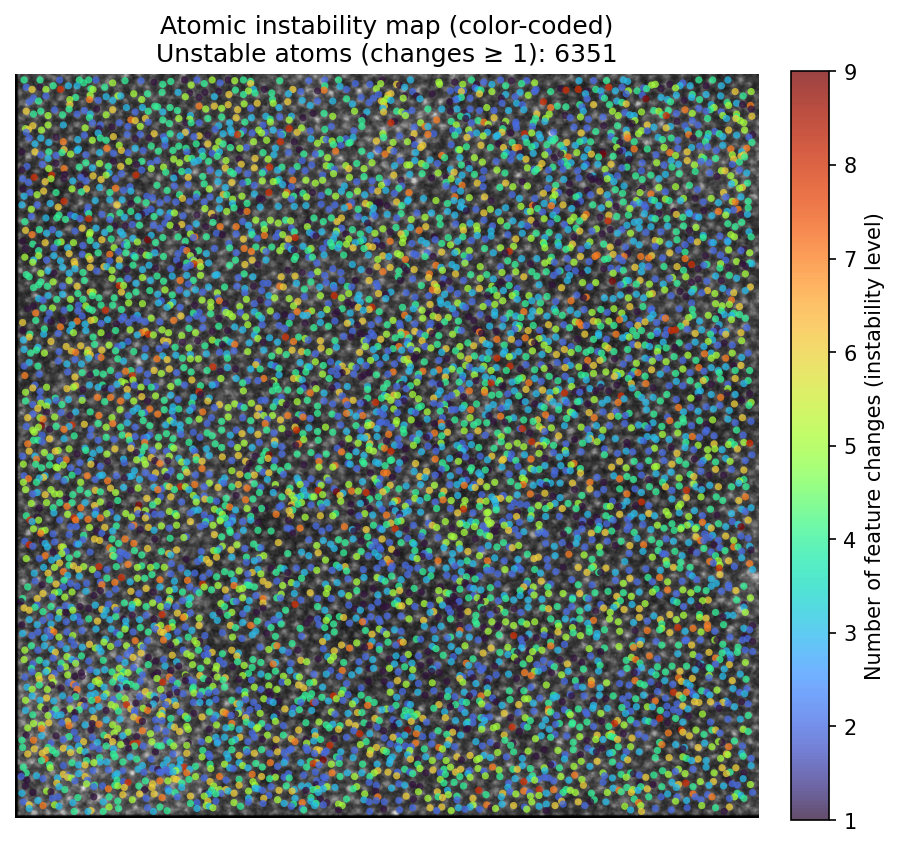

In [474]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------
# Parameters
# ----------------------------
frame_ref = 9          # which frame to show as background
min_changes = 1        # define "unstable"
point_size = 12
cmap = "turbo"       # perceptually uniform (good for heatmaps)

# ----------------------------
# Select unstable atoms
# ----------------------------
change_counts_arr = np.array(change_counts)
unstable_idx = np.where(change_counts_arr >= min_changes)[0]

print("Total atoms:", len(change_counts_arr))
print("Unstable atoms:", len(unstable_idx))

# Coordinates and values
xs = [unique_atoms[a][1] for a in unstable_idx]  # cols (x)
ys = [unique_atoms[a][0] for a in unstable_idx]  # rows (y)
vals = change_counts_arr[unstable_idx]

# ----------------------------
# Plot
# ----------------------------
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(nIm[frame_ref], cmap="gray")

sc = plt.scatter(
    xs, ys,
    c=vals,
    cmap=cmap,
    s=point_size,
    alpha=0.75,
    linewidths=0
)

cbar = plt.colorbar(sc, fraction=0.046, pad=0.04)
cbar.set_label("Number of feature changes (instability level)")

plt.title(
    f"Atomic instability map (color-coded)\n"
    f"Unstable atoms (changes ≥ {min_changes}): {len(unstable_idx)}"
)
plt.axis("off")

# Save
if "out_dir" in globals():
    fpath = os.path.join(out_dir, "unstable_atoms_colored_low_to_high.png")
    plt.savefig(fpath, bbox_inches="tight")
    print("Saved:", fpath)

plt.show()


### Defect dynamics classification
Classify changing atoms into persistent, oscillatory, and transient types.


{'persistent': 1717, 'oscillatory': 1962, 'transient': 2183}
Saved: results\3D_Stack_align2\changing_atoms_dynamics_classes.png


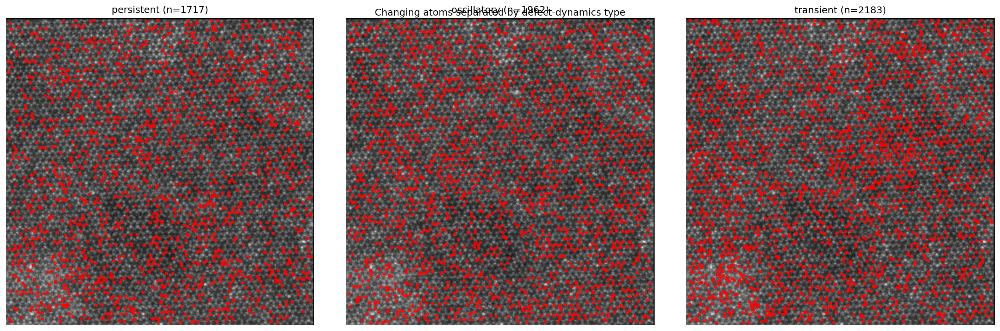

In [475]:
import numpy as np
import matplotlib.pyplot as plt
import os

def classify_atom(seq):
    """seq = feature labels over time for one atom (with -1 possible)."""
    seq = seq[seq >= 0]
    if len(seq) < 2:
        return "insufficient"

    # count transitions
    ch = np.sum(seq[1:] != seq[:-1])
    if ch == 0:
        return "stable"

    # compress consecutive duplicates (run-length encoding)
    comp = [seq[0]]
    for v in seq[1:]:
        if v != comp[-1]:
            comp.append(v)
    comp = np.array(comp)

    # oscillatory: mostly A<->B<->A<->B with only 2 states and many switches
    if len(np.unique(comp)) == 2 and len(comp) >= 5:
        return "oscillatory"

    # persistent: ends with a long final dwell (one switch then stays)
    # heuristic: last value appears in last 70% of the sequence
    last = seq[-1]
    tail_frac = np.mean(seq[int(0.3*len(seq)):] == last)
    if tail_frac > 0.8 and ch <= 3:
        return "persistent"

    # transient: has A->B->A pattern at least once
    for i in range(2, len(comp)):
        if comp[i] == comp[i-2] and comp[i] != comp[i-1]:
            return "transient"

    return "mixed"


# classify all atoms
classes = np.array([classify_atom(L[:, a]) for a in range(L.shape[1])])

# focus on changing atoms only
changing_idx = np.where(change_counts >= 1)[0]

groups = {
    "persistent": changing_idx[classes[changing_idx] == "persistent"],
    "oscillatory": changing_idx[classes[changing_idx] == "oscillatory"],
    "transient": changing_idx[classes[changing_idx] == "transient"],
}

print({k: len(v) for k, v in groups.items()})

# plot 3 maps
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=150)
for ax, (name, idxs) in zip(axes, groups.items()):
    ax.imshow(nIm[0], cmap="gray")
    if len(idxs) > 0:
        xs = [unique_atoms[a][1] for a in idxs]
        ys = [unique_atoms[a][0] for a in idxs]
        ax.scatter(xs, ys, s=10, alpha=0.8, c="Red")
    ax.set_title(f"{name} (n={len(idxs)})")
    ax.axis("off")

plt.suptitle("Changing atoms separated by defect-dynamics type", y=0.95)
plt.tight_layout()

if "out_dir" in globals():
    fpath = os.path.join(out_dir, "changing_atoms_dynamics_classes.png")
    plt.savefig(fpath, bbox_inches="tight")
    print("Saved:", fpath)

plt.show()


Density maps → where are atoms concentrated?



In [476]:
import numpy as np
from scipy.ndimage import gaussian_filter

def density_map(atom_indices, sigma=10):
    H, W = nIm[0].shape
    density = np.zeros((H, W), dtype=np.float32)

    for a in atom_indices:
        r, c = unique_atoms[a]
        density[int(r), int(c)] += 1

    return gaussian_filter(density, sigma=sigma)


In [477]:
def threshold_density(density, percentile=90):
    thr = np.percentile(density[density > 0], percentile)
    mask = density >= thr
    return mask, thr


In [478]:
import matplotlib.pyplot as plt

def plot_dense_regions(atom_indices, title, sigma=10, percentile=95):
    dens = density_map(atom_indices, sigma=sigma)
    mask, thr = threshold_density(dens, percentile=percentile)

    plt.figure(figsize=(6,6), dpi=150)
    plt.imshow(nIm[0], cmap="gray")

    # overlay dense regions only
    plt.imshow(
        np.ma.masked_where(~mask, dens),
        cmap="hot",
        alpha=0.85
    )

    plt.title(f"{title}\nDense regions (top {100-percentile}% density)")
    plt.axis("off")
    plt.show()


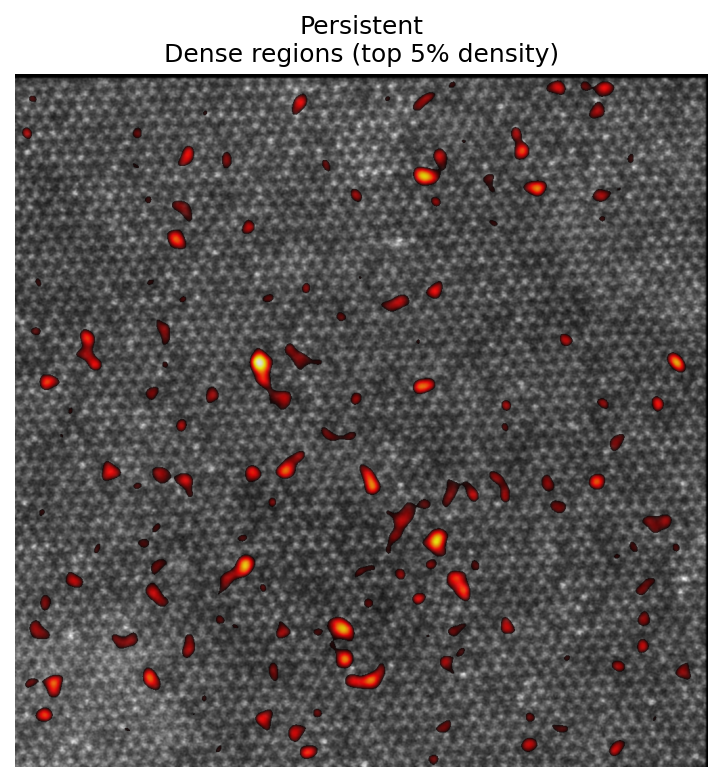

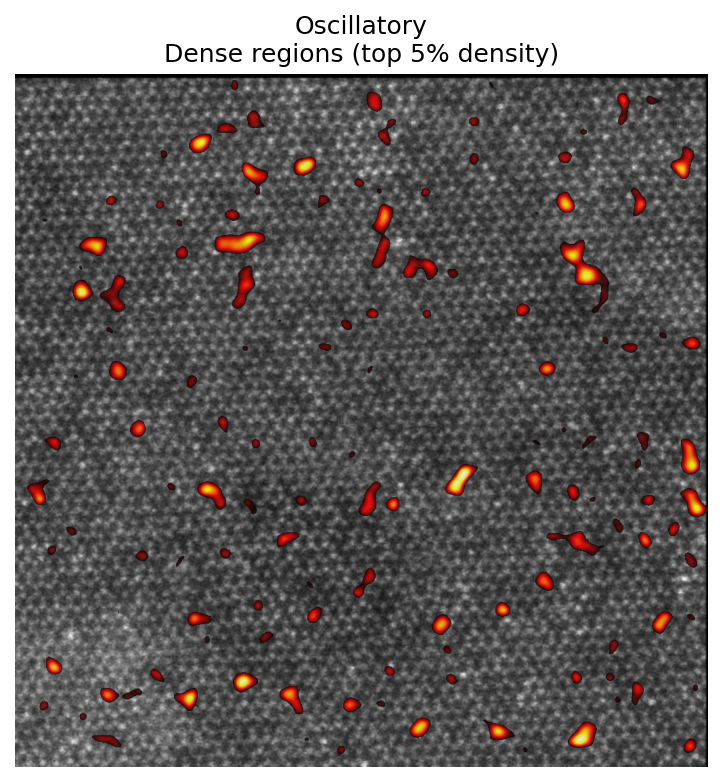

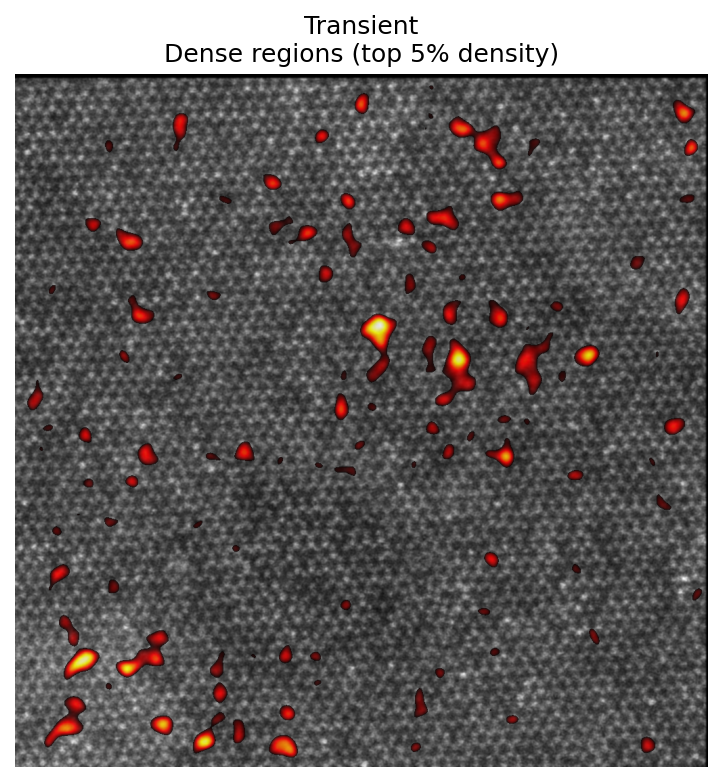

In [452]:
plot_dense_regions(groups["persistent"],  "Persistent")
plot_dense_regions(groups["oscillatory"], "Oscillatory")
plot_dense_regions(groups["transient"],   "Transient")


### Overlap analysis
Visualize spatial overlap of dense regions across defect dynamics types.


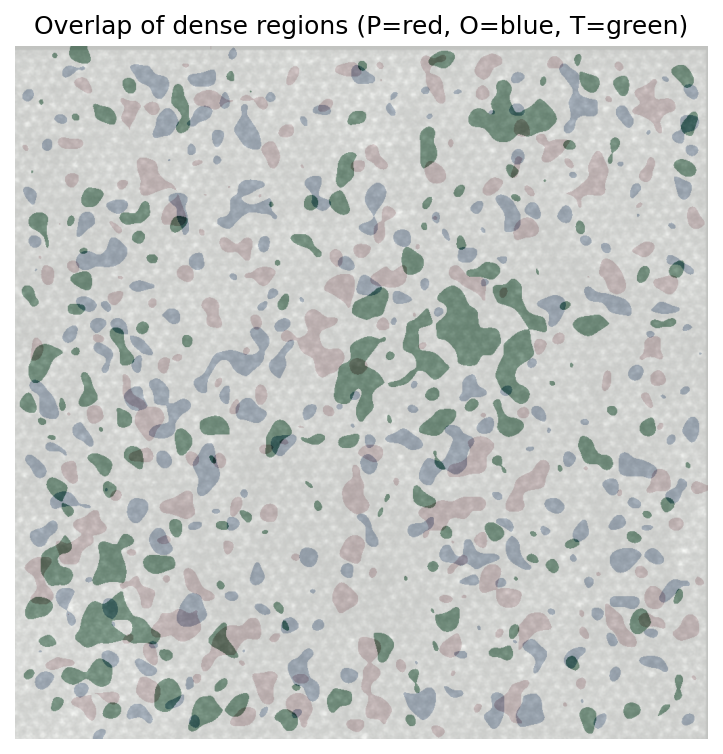

In [479]:
dens_p = density_map(groups["persistent"])
dens_o = density_map(groups["oscillatory"])
dens_t = density_map(groups["transient"])

mask_p, _ = threshold_density(dens_p, 90)
mask_o, _ = threshold_density(dens_o, 90)
mask_t, _ = threshold_density(dens_t, 90)

plt.figure(figsize=(6,6), dpi=150)
plt.imshow(nIm[0], cmap="gray")
plt.imshow(mask_p, cmap="Reds", alpha=0.4)
plt.imshow(mask_o, cmap="Blues", alpha=0.4)
plt.imshow(mask_t, cmap="Greens", alpha=0.4)
plt.title("Overlap of dense regions (P=red, O=blue, T=green)")
plt.axis("off")
plt.show()


# Results Summary

- The unsupervised workflow learns local atomic features directly from HAADF-STEM images without using any labeled defect data.
- By following these features over time, we can identify atomic sites whose local environments change.
- Atoms' environment show noticeable changes over time.
- Some changing atoms environment tend to appear in spatially concentrated regions rather than being randomly distributed.
- Density-based maps make these regions easier to see than plotting individual atoms.
- Further study could link the dens areas to physical defect categories. 
- Example image panels and animations help illustrate how local atomic environments evolve over time.
- This unsupervised analysis provides complementary insight alongside supervised defect detection methods.
